In [1]:
# 1) Setup: imports and paths
import os
import glob
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt

# Optional deps for atlas files
try:
    import nrrd
except ImportError:
    raise ImportError("Please install pynrrd in this kernel: pip install pynrrd")

DATA_DIR = "/home/Data_Drive_8TB_2/kykim/potrai/DAPI_downsampling"
ADATA_PATH = "/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/after_label_transfer_manual.h5ad"
ATLAS_ANNOT_PATH = os.path.join(DATA_DIR, "annotation_25.nrrd")
ATLAS_TEMPLATE_PATH = os.path.join(DATA_DIR, "average_template_25.nrrd")
STRUCTURE_TREE_PATH = os.path.join(DATA_DIR, "structure_tree_safe_2017.csv")

print("DATA_DIR:", DATA_DIR)
print("ADATA_PATH exists:", os.path.exists(ADATA_PATH))
print("ATLAS_ANNOT_PATH exists:", os.path.exists(ATLAS_ANNOT_PATH))
print("ATLAS_TEMPLATE_PATH exists:", os.path.exists(ATLAS_TEMPLATE_PATH))
print("STRUCTURE_TREE_PATH exists:", os.path.exists(STRUCTURE_TREE_PATH))

DATA_DIR: /home/Data_Drive_8TB_2/kykim/potrai/DAPI_downsampling
ADATA_PATH exists: True
ATLAS_ANNOT_PATH exists: True
ATLAS_TEMPLATE_PATH exists: True
STRUCTURE_TREE_PATH exists: True


In [3]:
# 2) Load adata and atlas resources
# Compatibility shim for older anndata readers on files that store null-typed entries
try:
    from anndata._io.specs.registry import _REGISTRY, IOSpec
    from h5py import Dataset as H5Dataset

    @_REGISTRY.register_read(H5Dataset, IOSpec("null", "0.1.0"))
    def _read_null_h5ad_elem(elem, *, _reader):
        return None
except Exception:
    pass

adata = sc.read_h5ad(ADATA_PATH)
print(adata)

annotation_vol, annotation_hdr = nrrd.read(ATLAS_ANNOT_PATH)
template_vol, template_hdr = nrrd.read(ATLAS_TEMPLATE_PATH)
print("annotation shape:", annotation_vol.shape, "dtype:", annotation_vol.dtype)
print("template shape:", template_vol.shape, "dtype:", template_vol.dtype)

st = pd.read_csv(STRUCTURE_TREE_PATH)
print("structure_tree columns:", st.columns.tolist())
print("structure_tree rows:", st.shape[0])

# Build id -> acronym/name mapper
id_col = "id" if "id" in st.columns else st.columns[0]
acr_col = "acronym" if "acronym" in st.columns else None
name_col = "name" if "name" in st.columns else None

id_to_acr = {}
id_to_name = {}
for _, r in st.iterrows():
    rid = int(r[id_col])
    id_to_acr[rid] = str(r[acr_col]) if acr_col is not None else str(rid)
    id_to_name[rid] = str(r[name_col]) if name_col is not None else str(rid)

AnnData object with n_obs × n_vars = 136456 × 300
    obs: 'fov', 'center_x', 'center_y', 'x_min', 'x_max', 'y_min', 'y_max', 'volume', 'sample_id', 'genotype', 'strain', 'sex', 'age', 'region_location', 'region_short', 'trem2_mutation', 'group', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_300_genes', '_scvi_batch', '_scvi_labels', 'batch', 'dataset', 'class_pred', 'class_score', 'subclass_pred', 'subclass_score', 'supertype_pred', 'supertype_score', 'cluster_pred', 'cluster_score', 'final_label_transfer', 'leiden_res_0.50', 'leiden_res_0.75', 'leiden_res_1.00', 'leiden_res_1.25', 'leiden_res_0.10', 'leiden_res_0.25', 'Mannual_annotaion', 'mannual_annotaion'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_c

In [4]:
# 3) Discover per-sample micron->mosaic transforms and define sample mapping
transform_csvs = sorted(glob.glob(os.path.join(DATA_DIR, "*_micron_to_mosaic_pixel_transform.csv")))
print("Found transform csv:")
for p in transform_csvs:
    print(" -", os.path.basename(p))

# Optional: auto-discover registration files if you exported them.
# Expected examples: *_mosaic_to_ccf.csv, *_ccf_registration.csv
registration_candidates = sorted(
    glob.glob(os.path.join(DATA_DIR, "*mosaic*ccf*.csv")) +
    glob.glob(os.path.join(DATA_DIR, "*ccf*registration*.csv")) +
    glob.glob(os.path.join(DATA_DIR, "*atlas*transform*.csv"))
)
print("Found registration candidates:")
for p in registration_candidates:
    print(" -", os.path.basename(p))

# Keys are adata.obs['sample_id'], values are transform CSV filenames in DATA_DIR.
sample_to_micron2px_csv = {
    "WT1": "WT-5xFAD10518pHip300GP_region_0_micron_to_mosaic_pixel_transform.csv",
    "5xFAD1": "WT-5xFAD10518pHip300GP_region_1_micron_to_mosaic_pixel_transform.csv",
    "WT3": "202209041036_5xFAD-TREM2-AnteHip-Region_1_micron_to_mosaic_pixel_transform.csv",
    "5xFAD3": "202209041036_5xFAD-TREM2-AnteHip-Region_3_micron_to_mosaic_pixel_transform.csv",
}

# Per-sample 2D coronal atlas registration inferred from DAPI/mosaic geometry
sample_registration = {
    "WT1": {
        "matrix_2x3": np.array([[2.59381898e-03, 0.00000000e+00, 1.47293598e+02],
                                  [0.00000000e+00, 2.45092025e-03, 1.09831902e+02]], dtype=float),
        "z_voxel": 30.0,
    },
    "5xFAD1": {
        "matrix_2x3": np.array([[-6.86013720e-03, 0.00000000e+00, 4.19000000e+02],
                                  [0.00000000e+00, 5.02025095e-03, 4.50000000e+01]], dtype=float),
        "z_voxel": 222.0,
    },
    "WT3": {
        "matrix_2x3": np.array([[-2.96753698e-03, 0.00000000e+00, 3.18705986e+02],
                                  [0.00000000e+00, 2.69763601e-03, 1.04583338e+02]], dtype=float),
        "z_voxel": 32.0,
    },
    "5xFAD3": {
        "matrix_2x3": np.array([[-6.16808019e-03, 0.00000000e+00, 4.35041126e+02],
                                  [0.00000000e+00, 6.07960199e-03, -5.16616915e+00]], dtype=float),
        "z_voxel": 258.0,
    },
}

# Keep this disabled because sample_registration is already populated.
ALLOW_PROVISIONAL_AUTO_CCF = False
PROVISIONAL_Z_SEARCH_STEP = 5

print("\nsample_id counts:")
print(adata.obs["sample_id"].value_counts(dropna=False))

manual_ready = [
    s for s, v in sample_registration.items()
    if (v.get("matrix_2x3") is not None and v.get("z_voxel") is not None)
]
print("\nAtlas-registration-ready samples:", manual_ready if len(manual_ready) > 0 else "None")
print("ALLOW_PROVISIONAL_AUTO_CCF:", ALLOW_PROVISIONAL_AUTO_CCF)
print("[NOTE] These sample_registration values were inferred from sample-wise 2D coronal DAPI/mosaic alignment to AllenMouseV3.")
print("[NOTE] Review and refine them manually if you need publication-grade registration.")

Found transform csv:
 - 202209041036_5xFAD-TREM2-AnteHip-Region_1_micron_to_mosaic_pixel_transform.csv
 - 202209041036_5xFAD-TREM2-AnteHip-Region_3_micron_to_mosaic_pixel_transform.csv
 - WT-5xFAD10518pHip300GP_region_0_micron_to_mosaic_pixel_transform.csv
 - WT-5xFAD10518pHip300GP_region_1_micron_to_mosaic_pixel_transform.csv
Found registration candidates:

sample_id counts:
sample_id
5xFAD3    37508
WT1       36450
5xFAD1    33649
WT3       28849
Name: count, dtype: int64

Atlas-registration-ready samples: ['WT1', '5xFAD1', 'WT3', '5xFAD3']
ALLOW_PROVISIONAL_AUTO_CCF: False
[NOTE] These sample_registration values were inferred from sample-wise 2D coronal DAPI/mosaic alignment to AllenMouseV3.
[NOTE] Review and refine them manually if you need publication-grade registration.


In [5]:
# 4) Coordinate transforms: micron -> mosaic pixel -> CCF voxel
def load_micron2px_matrix(csv_path):
    m = np.loadtxt(csv_path)
    if m.shape != (3, 3):
        raise ValueError(f"Expected 3x3 matrix, got {m.shape} from {csv_path}")
    return m

def apply_affine_2d(x, y, m3x3):
    pts = np.column_stack([x, y, np.ones(len(x))])
    out = pts @ m3x3.T
    return out[:, 0], out[:, 1]

def apply_2x3(x, y, m2x3):
    pts = np.column_stack([x, y, np.ones(len(x))])
    out = pts @ np.asarray(m2x3, dtype=float).T
    return out[:, 0], out[:, 1]

def build_bbox_m2x3(x_px, y_px, x_max, y_max, margin=0.02):
    x0, x1 = np.nanpercentile(x_px, [1, 99])
    y0, y1 = np.nanpercentile(y_px, [1, 99])
    if (x1 - x0) < 1e-6 or (y1 - y0) < 1e-6:
        return None
    tx0 = margin * (x_max - 1)
    tx1 = (1 - margin) * (x_max - 1)
    ty0 = margin * (y_max - 1)
    ty1 = (1 - margin) * (y_max - 1)
    sx = (tx1 - tx0) / (x1 - x0)
    sy = (ty1 - ty0) / (y1 - y0)
    bx = tx0 - sx * x0
    by = ty0 - sy * y0
    return np.array([[sx, 0.0, bx], [0.0, sy, by]], dtype=float)

def choose_best_z(annotation_vol, x_vox, y_vox, step=5):
    z_max, y_max, x_max = annotation_vol.shape
    xv = np.clip(np.rint(x_vox).astype(int), 0, x_max - 1)
    yv = np.clip(np.rint(y_vox).astype(int), 0, y_max - 1)
    best_z, best_score = None, -1.0
    for z in range(0, z_max, max(1, int(step))):
        ids = annotation_vol[z, yv, xv]
        score = np.mean(ids > 0)
        if score > best_score:
            best_score = score
            best_z = z
    return best_z, best_score

def manual_reg_ready(reg):
    if reg is None:
        return False
    m2x3 = reg.get("matrix_2x3", None)
    z_voxel = reg.get("z_voxel", None)
    if m2x3 is None or z_voxel is None:
        return False
    try:
        m2x3 = np.asarray(m2x3, dtype=float)
        z_voxel = float(z_voxel)
    except Exception:
        return False
    return m2x3.shape == (2, 3) and np.isfinite(m2x3).all() and np.isfinite(z_voxel)

adata.obs["x_mosaic_px"] = np.nan
adata.obs["y_mosaic_px"] = np.nan
adata.obs["x_ccf_vox"] = np.nan
adata.obs["y_ccf_vox"] = np.nan
adata.obs["z_ccf_vox"] = np.nan
adata.obs["ccf_reg_mode"] = "none"

z_max, y_max, x_max = annotation_vol.shape
provisional_used = []

for sid in adata.obs["sample_id"].astype(str).unique():
    smask = adata.obs["sample_id"].astype(str) == sid

    if sid not in sample_to_micron2px_csv:
        print(f"[WARN] sample {sid}: no micron->pixel mapping configured")
        continue

    t_csv = os.path.join(DATA_DIR, sample_to_micron2px_csv[sid])
    if not os.path.exists(t_csv):
        print(f"[WARN] sample {sid}: missing transform file -> {t_csv}")
        continue

    m_micron2px = load_micron2px_matrix(t_csv)
    x_um = adata.obs.loc[smask, "center_x"].values
    y_um = adata.obs.loc[smask, "center_y"].values
    x_px, y_px = apply_affine_2d(x_um, y_um, m_micron2px)

    adata.obs.loc[smask, "x_mosaic_px"] = x_px
    adata.obs.loc[smask, "y_mosaic_px"] = y_px

    reg = sample_registration.get(sid, None)
    if manual_reg_ready(reg):
        x_vox, y_vox = apply_2x3(x_px, y_px, reg["matrix_2x3"] )
        z_vox = float(reg["z_voxel"] )
        adata.obs.loc[smask, "x_ccf_vox"] = x_vox
        adata.obs.loc[smask, "y_ccf_vox"] = y_vox
        adata.obs.loc[smask, "z_ccf_vox"] = z_vox
        adata.obs.loc[smask, "ccf_reg_mode"] = "inferred_coronal_2d"
    elif ALLOW_PROVISIONAL_AUTO_CCF:
        m2x3_auto = build_bbox_m2x3(x_px, y_px, x_max=x_max, y_max=y_max, margin=0.02)
        if m2x3_auto is None:
            print(f"[WARN] sample {sid}: provisional transform could not be estimated")
            continue
        x_vox, y_vox = apply_2x3(x_px, y_px, m2x3_auto)
        z_vox, z_score = choose_best_z(annotation_vol, x_vox, y_vox, step=PROVISIONAL_Z_SEARCH_STEP)
        adata.obs.loc[smask, "x_ccf_vox"] = x_vox
        adata.obs.loc[smask, "y_ccf_vox"] = y_vox
        adata.obs.loc[smask, "z_ccf_vox"] = z_vox
        adata.obs.loc[smask, "ccf_reg_mode"] = "provisional_auto_bbox"
        provisional_used.append((sid, int(z_vox), float(z_score)))
        print(f"[QC_ONLY] sample {sid}: z_voxel={z_vox}, inside-brain score={z_score:.3f}")
    else:
        print(f"[SKIP] sample {sid}: manual registration missing and provisional auto disabled")

n_ready = adata.obs[["x_ccf_vox", "y_ccf_vox", "z_ccf_vox"]].notna().all(axis=1).sum()
print(adata.obs[["x_mosaic_px", "y_mosaic_px"]].describe())
print(f"\nCells with valid CCF voxel coordinates: {n_ready}/{adata.n_obs}")
print("ccf_reg_mode counts:")
print(adata.obs["ccf_reg_mode"].value_counts(dropna=False))

if len(provisional_used) > 0:
    print("\nProvisional summary (sample, z_voxel, inside-brain score):")
    for x in provisional_used:
        print(" -", x)

if n_ready == 0:
    print("No final CCF voxel coordinates yet. Check sample_registration or rerun with provisional auto enabled.")

         x_mosaic_px    y_mosaic_px
count  136456.000000  136456.000000
mean    30434.468724   25225.137822
std     14791.357075   12463.620028
min       208.501905     195.503362
25%     18411.088873   14882.156224
50%     30657.759508   24858.745463
75%     42227.703580   35422.285862
max     68628.491990   52541.484199

Cells with valid CCF voxel coordinates: 136456/136456
ccf_reg_mode counts:
ccf_reg_mode
inferred_coronal_2d    136456
Name: count, dtype: int64


In [7]:
# 5) Assign CCF region from annotation volume
z_max, y_max, x_max = annotation_vol.shape

adata.obs["ccf_id"] = -1
adata.obs["CCF_acronym"] = "Not_mapped"
adata.obs["CCF_name"] = "Not_mapped"

def _ccf_label_from_id(i):
    if int(i) <= 0:
        return "Not_mapped", "Not_mapped"
    return id_to_acr.get(int(i), "Unknown"), id_to_name.get(int(i), "Unknown")

valid = adata.obs[["x_ccf_vox", "y_ccf_vox", "z_ccf_vox"]].notna().all(axis=1)
if valid.sum() == 0:
    print("No cells have valid CCF voxel coordinates. Check cell 4/sample_registration.")
else:
    xv = np.rint(adata.obs.loc[valid, "x_ccf_vox"].values).astype(int)
    yv = np.rint(adata.obs.loc[valid, "y_ccf_vox"].values).astype(int)
    zv = np.rint(adata.obs.loc[valid, "z_ccf_vox"].values).astype(int)

    in_bounds = (
        (xv >= 0) & (xv < x_max) &
        (yv >= 0) & (yv < y_max) &
        (zv >= 0) & (zv < z_max)
    )

    idx_valid = adata.obs.index[valid]
    idx_in = idx_valid[in_bounds]

    ann_ids = annotation_vol[zv[in_bounds], yv[in_bounds], xv[in_bounds]].astype(int)
    adata.obs.loc[idx_in, "ccf_id"] = ann_ids
    mapped = [_ccf_label_from_id(i) for i in ann_ids]
    adata.obs.loc[idx_in, "CCF_acronym"] = [x[0] for x in mapped]
    adata.obs.loc[idx_in, "CCF_name"] = [x[1] for x in mapped]

print("Mapped cells:", int((adata.obs["ccf_id"] > 0).sum()), "/", adata.n_obs)
print(adata.obs["CCF_acronym"].value_counts().head(20))

Mapped cells: 132144 / 136456
CCF_acronym
MOB           50892
CP            12282
onl           11832
Not_mapped     4312
ccb            1854
PIR            1755
VL             1449
SSs6a          1357
SI             1229
CA3            1202
HY             1147
int            1082
BST            1082
VAL            1009
SSs5            983
LD              912
STR             862
V3              842
fi              811
SSp-ul6a        795
Name: count, dtype: int64


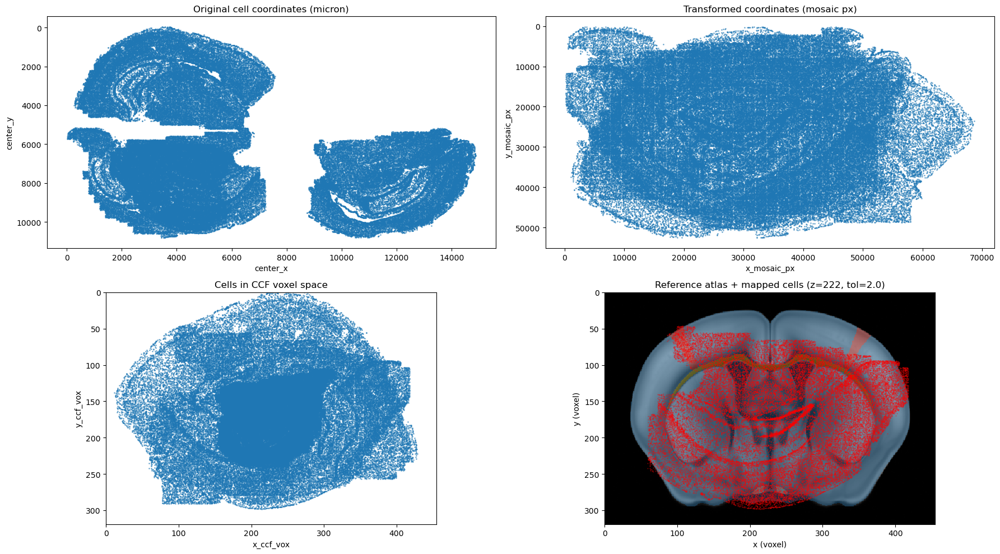


[QC] Coordinate range comparison
mosaic x range: (208.50190506378567, 68628.49199031196)
mosaic y range: (195.50336221621546, 52541.484198685066)
ccf x range: (11.7350840849831, 428.6108163567533)
ccf y range: (-3.9258958316585684, 298.14351730070257)
atlas x/y max: (455, 319)
in-bounds ratio (CCF voxel): 0.9997801489124699

Mapping ratio by sample_id
sample_id
WT1       0.988422
5xFAD1    0.981069
5xFAD3    0.965661
WT3       0.931887
Name: CCF_acronym, dtype: float64


In [ ]:
# 6) QC plots for registration and CCF annotation
fig, axes = plt.subplots(2, 2, figsize=(18, 10))
axes = axes.flatten()

# Panel A: original microscope coordinates (um)
axes[0].scatter(
    adata.obs["center_x"], adata.obs["center_y"],
    s=1, alpha=0.5
)
axes[0].invert_yaxis()
axes[0].set_title("Original cell coordinates (micron)")
axes[0].set_xlabel("center_x")
axes[0].set_ylabel("center_y")

# Panel B: transformed mosaic pixel coordinates (camera pixel space)
mosaic_valid = adata.obs["x_mosaic_px"].notna() & adata.obs["y_mosaic_px"].notna()
axes[1].scatter(
    adata.obs.loc[mosaic_valid, "x_mosaic_px"],
    adata.obs.loc[mosaic_valid, "y_mosaic_px"],
    s=1, alpha=0.5
)
axes[1].invert_yaxis()
axes[1].set_title("Transformed coordinates (mosaic px)")
axes[1].set_xlabel("x_mosaic_px")
axes[1].set_ylabel("y_mosaic_px")

# Panel C: CCF voxel coordinates only (same coordinate system as reference atlas)
ccf_cols = ["x_ccf_vox", "y_ccf_vox", "z_ccf_vox"]
ccf_valid = adata.obs[ccf_cols].notna().all(axis=1) if all(c in adata.obs.columns for c in ccf_cols) else pd.Series(False, index=adata.obs.index)
axes[2].scatter(
    adata.obs.loc[ccf_valid, "x_ccf_vox"] if ccf_valid.any() else [],
    adata.obs.loc[ccf_valid, "y_ccf_vox"] if ccf_valid.any() else [],
    s=1, alpha=0.5, color="#1f77b4"
)
axes[2].set_xlim(0, annotation_vol.shape[2] - 1)
axes[2].set_ylim(annotation_vol.shape[1] - 1, 0)
axes[2].set_aspect("equal")
axes[2].set_title("Cells in CCF voxel space")
axes[2].set_xlabel("x_ccf_vox")
axes[2].set_ylabel("y_ccf_vox")

# Panel D: reference atlas slice with mapped-cell overlay
if ccf_valid.any():
    reference_z = int(np.nanmedian(adata.obs.loc[ccf_valid, "z_ccf_vox"]))
else:
    reference_z = int(annotation_vol.shape[0] // 2)
reference_z = int(np.clip(reference_z, 0, annotation_vol.shape[0] - 1))

ref_template = template_vol[reference_z] if "template_vol" in globals() else None
ref_annotation = annotation_vol[reference_z]

if ref_template is not None:
    axes[3].imshow(ref_template, cmap="gray", interpolation="nearest")
axes[3].imshow(
    np.ma.masked_where(ref_annotation <= 0, ref_annotation),
    cmap="tab20",
    alpha=0.35,
    interpolation="nearest"
 )

# Overlay only cells close to this reference z slice
z_tol = 2.0
near_slice = ccf_valid & (np.abs(adata.obs["z_ccf_vox"] - reference_z) <= z_tol) if ccf_valid.any() else ccf_valid
axes[3].scatter(
    adata.obs.loc[near_slice, "x_ccf_vox"] if near_slice.any() else [],
    adata.obs.loc[near_slice, "y_ccf_vox"] if near_slice.any() else [],
    s=0.8, c="red", alpha=0.75, linewidths=0
)

axes[3].set_xlim(0, annotation_vol.shape[2] - 1)
axes[3].set_ylim(annotation_vol.shape[1] - 1, 0)
axes[3].set_aspect("equal")
axes[3].set_title(f"Reference atlas + mapped cells (z={reference_z}, tol={z_tol})")
axes[3].set_xlabel("x (voxel)")
axes[3].set_ylabel("y (voxel)")

plt.tight_layout()
plt.show()

print("\n[QC] Coordinate range comparison")
print("mosaic x range:", (float(np.nanmin(adata.obs["x_mosaic_px"])), float(np.nanmax(adata.obs["x_mosaic_px"]))))
print("mosaic y range:", (float(np.nanmin(adata.obs["y_mosaic_px"])), float(np.nanmax(adata.obs["y_mosaic_px"]))))
if ccf_valid.any():
    print("ccf x range:", (float(np.nanmin(adata.obs.loc[ccf_valid, "x_ccf_vox"])), float(np.nanmax(adata.obs.loc[ccf_valid, "x_ccf_vox"]))))
    print("ccf y range:", (float(np.nanmin(adata.obs.loc[ccf_valid, "y_ccf_vox"])), float(np.nanmax(adata.obs.loc[ccf_valid, "y_ccf_vox"]))))
else:
    print("ccf x range: no valid CCF voxel coordinates")
    print("ccf y range: no valid CCF voxel coordinates")
print("atlas x/y max:", (annotation_vol.shape[2] - 1, annotation_vol.shape[1] - 1))

if ccf_valid.any():
    in_bounds = (
        (adata.obs.loc[ccf_valid, "x_ccf_vox"] >= 0) & (adata.obs.loc[ccf_valid, "x_ccf_vox"] < annotation_vol.shape[2]) &
        (adata.obs.loc[ccf_valid, "y_ccf_vox"] >= 0) & (adata.obs.loc[ccf_valid, "y_ccf_vox"] < annotation_vol.shape[1]) &
        (adata.obs.loc[ccf_valid, "z_ccf_vox"] >= 0) & (adata.obs.loc[ccf_valid, "z_ccf_vox"] < annotation_vol.shape[0])
    )
    print("in-bounds ratio (CCF voxel):", float(in_bounds.mean()))
else:
    print("in-bounds ratio (CCF voxel): no valid CCF voxel coordinates")

if "CCF_acronym" in adata.obs.columns:
    print("\nMapping ratio by sample_id")
    tmp = (adata.obs["CCF_acronym"] != "Not_mapped").groupby(adata.obs["sample_id"], observed=False).mean()
    print(tmp.sort_values(ascending=False))
else:
    print("\nMapping ratio by sample_id: run cell 5 first to create CCF_acronym")

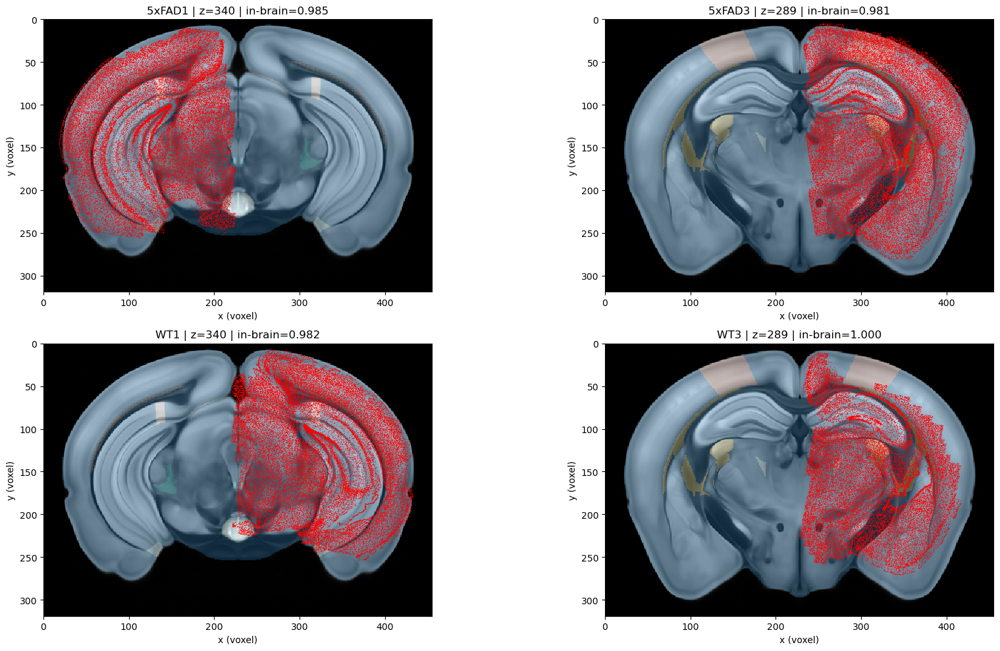

sample_id  n_valid  in_bounds_ratio  inside_brain_ratio  z_ref
   5xFAD1    33649              1.0            0.985111    340
   5xFAD3    37508              1.0            0.981231    289
      WT1    36450              1.0            0.981728    340
      WT3    28849              1.0            1.000000    289

Tip: inside_brain_ratio가 낮은 sample부터 sample_registration의 matrix_2x3, z_voxel 재보정이 필요합니다.


In [28]:
# 6b) Per-sample CCF mapping diagnostics on reference slices
samples = sorted(adata.obs["sample_id"].astype(str).unique().tolist())
rows = []

n_cols = 2
n_rows = int(np.ceil(len(samples) / n_cols))
fig, axes = plt.subplots(n_rows, n_cols, figsize=(9 * n_cols, 5 * n_rows))
axes = np.array(axes).reshape(-1)

for i, sid in enumerate(samples):
    ax = axes[i]
    smask = adata.obs["sample_id"].astype(str) == sid
    valid = smask & adata.obs[["x_ccf_vox", "y_ccf_vox", "z_ccf_vox"]].notna().all(axis=1)

    if valid.sum() == 0:
        ax.set_title(f"{sid}: no valid CCF vox")
        ax.axis("off")
        rows.append({"sample_id": sid, "n_valid": 0, "in_bounds_ratio": np.nan, "inside_brain_ratio": np.nan, "z_ref": np.nan})
        continue

    xv = np.rint(adata.obs.loc[valid, "x_ccf_vox"].values).astype(int)
    yv = np.rint(adata.obs.loc[valid, "y_ccf_vox"].values).astype(int)
    zv = np.rint(adata.obs.loc[valid, "z_ccf_vox"].values).astype(int)

    inb = (
        (xv >= 0) & (xv < annotation_vol.shape[2]) &
        (yv >= 0) & (yv < annotation_vol.shape[1]) &
        (zv >= 0) & (zv < annotation_vol.shape[0])
    )
    inside = np.zeros_like(inb, dtype=bool)
    inside[inb] = annotation_vol[zv[inb], yv[inb], xv[inb]] > 0

    z_ref = int(np.nanmedian(adata.obs.loc[valid, "z_ccf_vox"]))
    z_ref = int(np.clip(z_ref, 0, annotation_vol.shape[0] - 1))
    z_tol = 2.0
    near = valid & (np.abs(adata.obs["z_ccf_vox"] - z_ref) <= z_tol)

    ref_template = template_vol[z_ref] if "template_vol" in globals() else None
    ref_ann = annotation_vol[z_ref]

    if ref_template is not None:
        ax.imshow(ref_template, cmap="gray", interpolation="nearest")
    ax.imshow(np.ma.masked_where(ref_ann <= 0, ref_ann), cmap="tab20", alpha=0.30, interpolation="nearest")
    ax.scatter(
        adata.obs.loc[near, "x_ccf_vox"],
        adata.obs.loc[near, "y_ccf_vox"],
        s=0.8, c="red", alpha=0.75, linewidths=0
    )
    ax.set_xlim(0, annotation_vol.shape[2] - 1)
    ax.set_ylim(annotation_vol.shape[1] - 1, 0)
    ax.set_aspect("equal")
    ax.set_title(f"{sid} | z={z_ref} | in-brain={inside.mean():.3f}")
    ax.set_xlabel("x (voxel)")
    ax.set_ylabel("y (voxel)")

    rows.append({
        "sample_id": sid,
        "n_valid": int(valid.sum()),
        "in_bounds_ratio": float(inb.mean()),
        "inside_brain_ratio": float(inside.mean()),
        "z_ref": int(z_ref),
    })

for j in range(len(samples), len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()

diag_df = pd.DataFrame(rows).sort_values("sample_id")
print(diag_df.to_string(index=False))
print("\nTip: inside_brain_ratio가 낮은 sample부터 sample_registration의 matrix_2x3, z_voxel 재보정이 필요합니다.")

In [11]:
# 6c) Scale diagnostic: sample point-bbox vs atlas brain-bbox at sample z
def _bbox(arr_xy):
    x = arr_xy[:, 0]
    y = arr_xy[:, 1]
    return np.array([np.nanmin(x), np.nanmax(x), np.nanmin(y), np.nanmax(y)], dtype=float)

rows = []
for sid in sorted(adata.obs["sample_id"].astype(str).unique()):
    smask = adata.obs["sample_id"].astype(str) == sid
    valid = smask & adata.obs[["x_ccf_vox", "y_ccf_vox", "z_ccf_vox"]].notna().all(axis=1)
    if valid.sum() < 20:
        continue

    pts = adata.obs.loc[valid, ["x_ccf_vox", "y_ccf_vox"]].values
    z_ref = int(np.nanmedian(adata.obs.loc[valid, "z_ccf_vox"]))
    z_ref = int(np.clip(z_ref, 0, annotation_vol.shape[0] - 1))

    mask = annotation_vol[z_ref] > 0
    yy, xx = np.where(mask)
    brain = np.column_stack([xx, yy])
    if brain.shape[0] < 20:
        continue

    pbb = _bbox(pts)
    bbb = _bbox(brain)
    p_w, p_h = (pbb[1] - pbb[0]), (pbb[3] - pbb[2])
    b_w, b_h = (bbb[1] - bbb[0]), (bbb[3] - bbb[2])

    rows.append({
        "sample_id": sid,
        "z_ref": z_ref,
        "pts_w": float(p_w),
        "pts_h": float(p_h),
        "brain_w": float(b_w),
        "brain_h": float(b_h),
        "w_ratio": float(p_w / b_w if b_w > 0 else np.nan),
        "h_ratio": float(p_h / b_h if b_h > 0 else np.nan),
    })

scale_df = pd.DataFrame(rows).sort_values("sample_id")
print(scale_df.to_string(index=False))

print("\nHeuristic:")
print("- w_ratio/h_ratio가 0.8~1.2면 atlas 단면과 크기 유사")
print("- 0.6 이하이면 sample_registration scale이 작은 쪽으로 치우쳤을 가능성이 큼")

sample_id  z_ref      pts_w      pts_h  brain_w  brain_h  w_ratio  h_ratio
   5xFAD1    222 358.174507 252.096793    383.0    269.0 0.935181 0.937163
   5xFAD3    258 416.875732 295.009684    400.0    286.0 1.042189 1.031502
      WT1     30 146.890402 127.381669    160.0    136.0 0.918065 0.936630
      WT3     32 165.687968 141.210403    159.0    139.0 1.042063 1.015902

Heuristic:
- w_ratio/h_ratio가 0.8~1.2면 atlas 단면과 크기 유사
- 0.6 이하이면 sample_registration scale이 작은 쪽으로 치우쳤을 가능성이 큼


In [12]:
# 6d) z re-search diagnostic with fixed x/y CCF coordinates
def _inside_ratio_at_z(xv, yv, z):
    z = int(z)
    xvi = np.clip(np.rint(xv).astype(int), 0, annotation_vol.shape[2] - 1)
    yvi = np.clip(np.rint(yv).astype(int), 0, annotation_vol.shape[1] - 1)
    ids = annotation_vol[z, yvi, xvi]
    return float(np.mean(ids > 0))

rows = []
z_max = annotation_vol.shape[0]
for sid in sorted(adata.obs["sample_id"].astype(str).unique()):
    smask = adata.obs["sample_id"].astype(str) == sid
    valid_xy = smask & adata.obs[["x_ccf_vox", "y_ccf_vox"]].notna().all(axis=1)
    if valid_xy.sum() < 20:
        continue

    xv = adata.obs.loc[valid_xy, "x_ccf_vox"].values
    yv = adata.obs.loc[valid_xy, "y_ccf_vox"].values

    z_current = int(np.nanmedian(adata.obs.loc[smask & adata.obs["z_ccf_vox"].notna(), "z_ccf_vox"]))
    score_current = _inside_ratio_at_z(xv, yv, z_current)

    coarse_step = 4
    coarse_scores = []
    for z in range(0, z_max, coarse_step):
        coarse_scores.append((z, _inside_ratio_at_z(xv, yv, z)))
    z_coarse = max(coarse_scores, key=lambda t: t[1])[0]

    fine_candidates = range(max(0, z_coarse - 8), min(z_max, z_coarse + 9))
    fine_scores = [(z, _inside_ratio_at_z(xv, yv, z)) for z in fine_candidates]
    z_best, score_best = max(fine_scores, key=lambda t: t[1])

    rows.append({
        "sample_id": sid,
        "z_current": z_current,
        "score_current": score_current,
        "z_best": int(z_best),
        "score_best": float(score_best),
        "delta_z": int(z_best - z_current),
        "delta_score": float(score_best - score_current),
    })

z_diag = pd.DataFrame(rows).sort_values("sample_id")
print(z_diag.to_string(index=False))
print("\nInterpretation: delta_z가 크고 delta_score도 의미있으면 z_voxel 재설정 효과가 큽니다.")

sample_id  z_current  score_current  z_best  score_best  delta_z  delta_score
   5xFAD1        222       0.981069     253    0.985735       31     0.004666
   5xFAD3        258       0.965661     285    0.974032       27     0.008372
      WT1         30       0.988422     155    1.000000      125     0.011578
      WT3         32       0.931887     157    1.000000      125     0.068113

Interpretation: delta_z가 크고 delta_score도 의미있으면 z_voxel 재설정 효과가 큽니다.


In [13]:
# 6e) Apply z-only tuning from diagnostic table (safe: x/y matrix unchanged)
AUTO_APPLY_Z_TUNING = True
MIN_DELTA_Z = 20
MIN_DELTA_SCORE = 0.01

if "z_diag" not in globals() or z_diag.empty:
    raise RuntimeError("Run cell 6d first to build z_diag.")

if AUTO_APPLY_Z_TUNING:
    changed = []
    for _, r in z_diag.iterrows():
        sid = str(r["sample_id"] )
        dz = int(r["delta_z"] )
        ds = float(r["delta_score"] )
        if (abs(dz) >= MIN_DELTA_Z) and (ds >= MIN_DELTA_SCORE) and (sid in sample_registration):
            old_z = float(sample_registration[sid]["z_voxel"] )
            new_z = float(r["z_best"] )
            sample_registration[sid]["z_voxel"] = new_z
            changed.append((sid, old_z, new_z, ds))

    if len(changed) == 0:
        print("No sample passed z-tuning thresholds.")
    else:
        print("Applied z-tuning:")
        for sid, old_z, new_z, ds in changed:
            print(f" - {sid}: {old_z:.1f} -> {new_z:.1f} (delta_score={ds:.4f})")
else:
    print("AUTO_APPLY_Z_TUNING=False, no changes applied.")

Applied z-tuning:
 - WT1: 30.0 -> 155.0 (delta_score=0.0116)
 - WT3: 32.0 -> 157.0 (delta_score=0.0681)


In [ ]:
# 6f) Interactive registration UI (manual tuning against reference atlas, with rotation)
import copy
import ipywidgets as widgets
from IPython.display import display, clear_output

if "sample_registration" not in globals():
    raise RuntimeError("sample_registration not found. Run previous setup cells first.")
if "annotation_vol" not in globals() or "template_vol" not in globals():
    raise RuntimeError("Atlas volumes not found. Run loading cells first.")
if "x_mosaic_px" not in adata.obs.columns or "y_mosaic_px" not in adata.obs.columns:
    raise RuntimeError("x_mosaic_px / y_mosaic_px not found. Run coordinate transform cell first.")

ui_samples = [s for s in ["WT1", "5xFAD1", "WT3", "5xFAD3"] if s in adata.obs["sample_id"].astype(str).unique()]
if len(ui_samples) == 0:
    raise RuntimeError("No target samples found in adata.obs['sample_id']")

working_registration = copy.deepcopy(sample_registration)

def _m2x3_to_params(m2x3):
    # Decompose A=[[a,b],[c,d]] into R(theta) @ diag(sx, sy) and translation.
    m = np.asarray(m2x3, dtype=float)
    a, b, tx = m[0, 0], m[0, 1], m[0, 2]
    c, d, ty = m[1, 0], m[1, 1], m[1, 2]

    sx = float(np.hypot(a, c))
    sy = float(np.hypot(b, d))
    if sx < 1e-12:
        theta_deg = 0.0
    else:
        theta_deg = float(np.degrees(np.arctan2(c, a)))

    # Keep signs close to existing orientation when possible.
    det = a * d - b * c
    if det < 0:
        sy = -sy

    theta_deg = theta_deg % 360.0

    return sx, sy, theta_deg, float(tx), float(ty)

def _params_to_m2x3(sx, sy, theta_deg, tx, ty):
    th = np.radians(float(theta_deg))
    ct = np.cos(th)
    st = np.sin(th)
    return np.array([[float(sx) * ct, -float(sy) * st, float(tx)],
                     [float(sx) * st,  float(sy) * ct, float(ty)]], dtype=float)

def _sample_xy_vox_from_reg(sid, reg):
    smask = adata.obs["sample_id"].astype(str) == sid
    x_px = adata.obs.loc[smask, "x_mosaic_px"].values
    y_px = adata.obs.loc[smask, "y_mosaic_px"].values
    good = np.isfinite(x_px) & np.isfinite(y_px)
    if good.sum() == 0:
        return np.array([]), np.array([]), np.array([], dtype=bool), smask
    xv, yv = apply_2x3(x_px[good], y_px[good], reg["matrix_2x3"])
    inb = (
        (xv >= 0) & (xv < annotation_vol.shape[2]) &
        (yv >= 0) & (yv < annotation_vol.shape[1])
    )
    return xv, yv, inb, smask

def _inside_ratio_for_sample(sid, reg):
    xv, yv, inb, _ = _sample_xy_vox_from_reg(sid, reg)
    if len(xv) == 0:
        return np.nan
    z = int(np.clip(round(float(reg["z_voxel"])), 0, annotation_vol.shape[0] - 1))
    xvi = np.clip(np.rint(xv[inb]).astype(int), 0, annotation_vol.shape[2] - 1)
    yvi = np.clip(np.rint(yv[inb]).astype(int), 0, annotation_vol.shape[1] - 1)
    if len(xvi) == 0:
        return 0.0
    ids = annotation_vol[z, yvi, xvi]
    return float(np.mean(ids > 0))

def _plot_one_sample(ax, sid, reg):
    z = int(np.clip(round(float(reg["z_voxel"])), 0, annotation_vol.shape[0] - 1))
    ref_template = template_vol[z]
    ref_ann = annotation_vol[z]

    xv, yv, _, _ = _sample_xy_vox_from_reg(sid, reg)
    if len(xv) == 0:
        ax.set_title(f"{sid}: no valid points")
        ax.axis("off")
        return

    ax.imshow(ref_template, cmap="gray", interpolation="nearest")
    ax.imshow(np.ma.masked_where(ref_ann <= 0, ref_ann), cmap="tab20", alpha=0.30, interpolation="nearest")
    ax.scatter(xv, yv, s=0.8, c="red", alpha=0.75, linewidths=0)
    ax.set_xlim(0, annotation_vol.shape[2] - 1)
    ax.set_ylim(annotation_vol.shape[1] - 1, 0)
    ax.set_aspect("equal")
    score = _inside_ratio_for_sample(sid, reg)
    ax.set_title(f"{sid} | z={z} | in-brain={score:.3f}")
    ax.set_xlabel("x (voxel)")
    ax.set_ylabel("y (voxel)")

def _plot_all_4(reg_dict):
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    axes = axes.flatten()
    for i, sid in enumerate(ui_samples):
        _plot_one_sample(axes[i], sid, reg_dict[sid])
    for j in range(len(ui_samples), 4):
        axes[j].axis("off")
    plt.tight_layout()
    plt.show()

sample_dd = widgets.Dropdown(options=ui_samples, value=ui_samples[0], description="sample")
sx_w = widgets.FloatSlider(description="sx", min=-0.02, max=0.02, step=1e-6, readout_format=".6f", continuous_update=False)
sy_w = widgets.FloatSlider(description="sy", min=-0.02, max=0.02, step=1e-6, readout_format=".6f", continuous_update=False)
theta_w = widgets.FloatSlider(description="theta(deg)", min=0.0, max=360.0, step=0.1, readout_format=".1f", continuous_update=False)
tx_w = widgets.FloatSlider(description="tx", min=-50, max=500, step=0.1, readout_format=".1f", continuous_update=False)
ty_w = widgets.FloatSlider(description="ty", min=-100, max=400, step=0.1, readout_format=".1f", continuous_update=False)
z_w = widgets.IntSlider(description="z", min=0, max=annotation_vol.shape[0] - 1, step=1, continuous_update=False)

preview_btn = widgets.Button(description="Preview selected", button_style="info")
save_btn = widgets.Button(description="Save selected", button_style="warning")
plot_all_btn = widgets.Button(description="Plot all 4 overlays", button_style="success")
apply_btn = widgets.Button(description="Apply to sample_registration", button_style="primary")
reset_btn = widgets.Button(description="Reset from sample_registration")

status_html = widgets.HTML()
out_preview = widgets.Output()
out_all = widgets.Output()

def _load_widgets_from_sample(sid):
    reg = working_registration[sid]
    sx, sy, th, tx, ty = _m2x3_to_params(reg["matrix_2x3"])
    sx_w.value = sx
    sy_w.value = sy
    theta_w.value = th
    tx_w.value = tx
    ty_w.value = ty
    z_w.value = int(np.clip(round(float(reg["z_voxel"])), 0, annotation_vol.shape[0] - 1))

def _build_reg_from_widgets():
    return {
        "matrix_2x3": _params_to_m2x3(sx_w.value, sy_w.value, theta_w.value, tx_w.value, ty_w.value),
        "z_voxel": float(z_w.value),
    }

def _update_status(sid, reg):
    score = _inside_ratio_for_sample(sid, reg)
    status_html.value = f"<b>{sid}</b> in-brain score: <b>{score:.4f}</b> | theta={theta_w.value:.1f} deg"

def _preview_selected(*_):
    sid = sample_dd.value
    reg = _build_reg_from_widgets()
    _update_status(sid, reg)
    with out_preview:
        clear_output(wait=True)
        fig, ax = plt.subplots(1, 1, figsize=(7, 6))
        _plot_one_sample(ax, sid, reg)
        plt.tight_layout()
        plt.show()

def _save_selected(*_):
    sid = sample_dd.value
    working_registration[sid] = _build_reg_from_widgets()
    _update_status(sid, working_registration[sid])
    print(f"Saved working params for {sid}")

def _plot_all(*_):
    with out_all:
        clear_output(wait=True)
        _plot_all_4(working_registration)

def _apply_all(*_):
    for sid in ui_samples:
        sample_registration[sid] = {
            "matrix_2x3": np.asarray(working_registration[sid]["matrix_2x3"], dtype=float),
            "z_voxel": float(working_registration[sid]["z_voxel"]),
        }
    print("Applied working_registration -> sample_registration")
    print("Now rerun the label rebuild cell to refresh ccf labels.")

def _reset_from_base(*_):
    for sid in ui_samples:
        sample_registration_m = np.asarray(sample_registration[sid]["matrix_2x3"], dtype=float)
        working_registration[sid] = {
            "matrix_2x3": sample_registration_m.copy(),
            "z_voxel": float(sample_registration[sid]["z_voxel"]),
        }
    _load_widgets_from_sample(sample_dd.value)
    _preview_selected()
    print("Reset working params from current sample_registration")

def _on_sample_change(change):
    if change["name"] == "value" and change["new"] is not None:
        _load_widgets_from_sample(change["new"])
        _preview_selected()

sample_dd.observe(_on_sample_change, names="value")
preview_btn.on_click(_preview_selected)
save_btn.on_click(_save_selected)
plot_all_btn.on_click(_plot_all)
apply_btn.on_click(_apply_all)
reset_btn.on_click(_reset_from_base)

_load_widgets_from_sample(sample_dd.value)
_preview_selected()

display(widgets.VBox([
    widgets.HTML("<h3>Manual CCF Registration UI</h3>"),
    widgets.HTML("Use sliders to align each sample onto reference atlas, then Save selected -> Plot all 4 -> Apply."),
    sample_dd,
    widgets.HBox([sx_w, sy_w, theta_w]),
    widgets.HBox([tx_w, ty_w, z_w]),
    widgets.HBox([preview_btn, save_btn, plot_all_btn, apply_btn, reset_btn]),
    status_html,
    out_preview,
    out_all,
]))

In [44]:
# 7) Save outputs
modes = set(adata.obs.get("ccf_reg_mode", pd.Series(dtype=str)).astype(str).unique())
if "manual" in modes:
    suffix = "manual"
elif "inferred_coronal_2d" in modes:
    suffix = "inferred"
else:
    suffix = "provisional"

OUT_H5AD = f"/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/after_label_transfer_{suffix}_ccf_annotated.h5ad"
OUT_CSV = f"/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/after_label_transfer_{suffix}_ccf_obs.csv"

adata.write_h5ad(OUT_H5AD)
adata.obs.to_csv(OUT_CSV)

print("Saved:")
print(" -", OUT_H5AD)
print(" -", OUT_CSV)
print("mode:", suffix)
if suffix == "inferred":
    print("[NOTE] This file uses inferred 2D coronal DAPI-to-Allen registration. Review before publication use.")
elif suffix == "provisional":
    print("[NOTE] This file contains provisional CCF mapping only. Use registration before final interpretation.")

Saved:
 - /home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/after_label_transfer_inferred_ccf_annotated.h5ad
 - /home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/after_label_transfer_inferred_ccf_obs.csv
mode: inferred
[NOTE] This file uses inferred 2D coronal DAPI-to-Allen registration. Review before publication use.


In [45]:
# 8) Review or edit sample_registration inferred from atlas alignment
print("Current sample_registration:")
for key, value in sample_registration.items():
    print(f"\n{key}")
    print("z_voxel:", value["z_voxel"] )
    print("matrix_2x3:")
    print(np.asarray(value["matrix_2x3"], dtype=float))

print("\n[EDIT HERE IF NEEDED]")
print("Update sample_registration in-place, then rerun cell 9 if you want to rebuild labels explicitly.")

Current sample_registration:

WT1
z_voxel: 30.0
matrix_2x3:
[[2.59381898e-03 0.00000000e+00 1.47293598e+02]
 [0.00000000e+00 2.45092025e-03 1.09831902e+02]]

5xFAD1
z_voxel: 222.0
matrix_2x3:
[[-6.86013720e-03  0.00000000e+00  4.19000000e+02]
 [ 0.00000000e+00  5.02025095e-03  4.50000000e+01]]

WT3
z_voxel: 32.0
matrix_2x3:
[[-2.96753698e-03  0.00000000e+00  3.18705986e+02]
 [ 0.00000000e+00  2.69763601e-03  1.04583338e+02]]

5xFAD3
z_voxel: 258.0
matrix_2x3:
[[-6.16808019e-03  0.00000000e+00  4.35041126e+02]
 [ 0.00000000e+00  6.07960199e-03 -5.16616915e+00]]

[EDIT HERE IF NEEDED]
Update sample_registration in-place, then rerun cell 9 if you want to rebuild labels explicitly.


In [29]:
# 9) Apply sample_registration and rebuild final CCF labels
def _apply_2x3(x, y, m2x3):
    pts = np.column_stack([x, y, np.ones(len(x))])
    out = pts @ np.asarray(m2x3, dtype=float).T
    return out[:, 0], out[:, 1]

def _to_float_or_nan(v):
    try:
        if v is None:
            return np.nan
        return float(v)
    except Exception:
        return np.nan

def _manual_reg_ready(reg):
    if reg is None:
        return False
    m2x3 = np.asarray(reg.get("matrix_2x3", np.full((2, 3), np.nan)), dtype=float)
    z = _to_float_or_nan(reg.get("z_voxel", np.nan))
    return m2x3.shape == (2, 3) and np.isfinite(m2x3).all() and np.isfinite(z)

def _ccf_label_from_id(i):
    if int(i) <= 0:
        return "Not_mapped", "Not_mapped"
    return id_to_acr.get(int(i), "Unknown"), id_to_name.get(int(i), "Unknown")

ready_samples = [
    s for s in adata.obs["sample_id"].astype(str).unique()
    if _manual_reg_ready(sample_registration.get(s, None))
]

if len(ready_samples) == 0:
    raise RuntimeError("No valid sample_registration found. Check cell 3 or edit cell 8 first.")

print("Registration will be applied to:", ready_samples)

for sid in ready_samples:
    smask = adata.obs["sample_id"].astype(str) == sid
    adata.obs.loc[smask, "x_ccf_vox"] = np.nan
    adata.obs.loc[smask, "y_ccf_vox"] = np.nan
    adata.obs.loc[smask, "z_ccf_vox"] = np.nan
    adata.obs.loc[smask, "ccf_id"] = -1
    adata.obs.loc[smask, "CCF_acronym"] = "Not_mapped"
    adata.obs.loc[smask, "CCF_name"] = "Not_mapped"

    reg = sample_registration[sid]
    m2x3 = np.asarray(reg["matrix_2x3"], dtype=float)
    z = _to_float_or_nan(reg["z_voxel"] )

    x_px = adata.obs.loc[smask, "x_mosaic_px"].values
    y_px = adata.obs.loc[smask, "y_mosaic_px"].values
    good = np.isfinite(x_px) & np.isfinite(y_px)
    if good.sum() == 0:
        print(f"[WARN] {sid}: no finite mosaic coordinates")
        continue

    x_vox, y_vox = _apply_2x3(x_px[good], y_px[good], m2x3)
    idx = adata.obs.index[smask][good]
    adata.obs.loc[idx, "x_ccf_vox"] = x_vox
    adata.obs.loc[idx, "y_ccf_vox"] = y_vox
    adata.obs.loc[idx, "z_ccf_vox"] = z
    adata.obs.loc[smask, "ccf_reg_mode"] = "inferred_coronal_2d"

z_max, y_max, x_max = annotation_vol.shape
valid = adata.obs[["x_ccf_vox", "y_ccf_vox", "z_ccf_vox"]].notna().all(axis=1)
use_rows = valid & (adata.obs["ccf_reg_mode"].astype(str) == "inferred_coronal_2d")

if use_rows.sum() > 0:
    xv = np.rint(adata.obs.loc[use_rows, "x_ccf_vox"].values).astype(int)
    yv = np.rint(adata.obs.loc[use_rows, "y_ccf_vox"].values).astype(int)
    zv = np.rint(adata.obs.loc[use_rows, "z_ccf_vox"].values).astype(int)
    inb = (xv >= 0) & (xv < x_max) & (yv >= 0) & (yv < y_max) & (zv >= 0) & (zv < z_max)
    idx_in = adata.obs.index[use_rows][inb]
    ann = annotation_vol[zv[inb], yv[inb], xv[inb]].astype(int)
    adata.obs.loc[idx_in, "ccf_id"] = ann
    mapped = [_ccf_label_from_id(i) for i in ann]
    adata.obs.loc[idx_in, "CCF_acronym"] = [x[0] for x in mapped]
    adata.obs.loc[idx_in, "CCF_name"] = [x[1] for x in mapped]

print("valid registered CCF vox:", int(use_rows.sum()), "/", adata.n_obs)
print("registered CCF labels:", int(((adata.obs["ccf_id"] > 0) & use_rows).sum()), "/", adata.n_obs)
print(adata.obs["CCF_acronym"].value_counts().head(15))

Registration will be applied to: ['WT1', '5xFAD1', 'WT3', '5xFAD3']
valid registered CCF vox: 136456 / 136456
registered CCF labels: 134585 / 136456
CCF_acronym
CA1      10073
DG-mo     4518
CA3       4471
SCig      2762
MRN       2716
CP        2691
or        2633
VPM       2566
DG-sg     2281
RSPv5     2150
LP        2026
PO        1949
MB        1946
MEA       1919
SNr       1881
Name: count, dtype: int64


Added hierarchy columns: ['CCF_level_0', 'CCF_level_1', 'CCF_level_2', 'CCF_level_3', 'CCF_level_4', 'CCF_level_5', 'CCF_level_6', 'CCF_level_7', 'CCF_level_8', 'CCF_level_9']
Added summary columns:
['CCF_label_count', 'CCF_label_rank', 'CCF_label_in_top20', 'CCF_label_count_top20', 'CCF_confidence']

Top 20 CCF labels:
CCF_acronym
CA1             10073
DG-mo            4518
CA3              4471
SCig             2762
MRN              2716
CP               2691
or               2633
VPM              2566
DG-sg            2281
RSPv5            2150
LP               2026
PO               1949
MB               1946
MEA              1919
SNr              1881
Not_mapped       1871
MD               1595
SCiw             1556
ccs              1484
fiber tracts     1432
Name: count, dtype: int64

Confidence summary:
count    136456.000000
mean          0.812944
std           0.242870
min           0.000000
25%           0.650000
50%           0.950000
75%           1.000000
max           1.00

/tmp/ipykernel_1513194/2216715401.py:77: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  sample_order = adata.obs.groupby("sample_id")["CCF_confidence"].median().sort_values(ascending=False).index.tolist()
/tmp/ipykernel_1513194/2216715401.py:79: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[1].boxplot(box_data, labels=sample_order, showfliers=False)


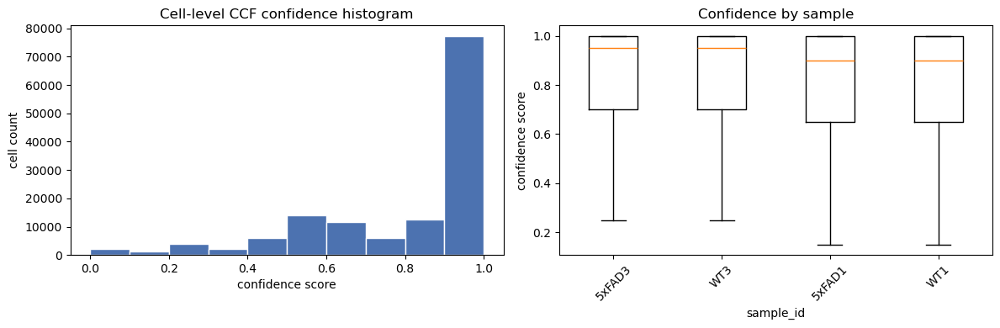

In [30]:
# 10) Add CCF outputs to adata.obs and plot confidence histogram
from sklearn.neighbors import NearestNeighbors

# Hierarchy columns from structure_tree
st_lookup = st[[id_col, "structure_id_path"]].dropna().copy()
st_lookup[id_col] = st_lookup[id_col].astype(int)
id_to_path = dict(zip(st_lookup[id_col], st_lookup["structure_id_path"]))

def _path_names_for_id(ccf_id):
    ccf_id = int(ccf_id)
    if ccf_id <= 0 or ccf_id not in id_to_path:
        return []
    raw = str(id_to_path[ccf_id]).strip().strip("/")
    if raw == "":
        return []
    ids = [int(x) for x in raw.split("/") if x != ""]
    return [id_to_name.get(i, "") for i in ids]

paths = [_path_names_for_id(v) for v in adata.obs["ccf_id"].fillna(-1).astype(int)]
max_depth = max([len(p) for p in paths] + [0])
for level in range(max_depth):
    adata.obs[f"CCF_level_{level}"] = [p[level] if level < len(p) else "" for p in paths]

# Label count summary columns
labels = adata.obs["CCF_acronym"].astype(str)
label_counts = labels.value_counts()
top20_counts = label_counts.head(20)
adata.obs["CCF_label_count"] = labels.map(label_counts).astype("Int64")
adata.obs["CCF_label_rank"] = labels.map({k: i + 1 for i, k in enumerate(label_counts.index)}).astype("Int64")
adata.obs["CCF_label_in_top20"] = labels.isin(set(top20_counts.index))
adata.obs["CCF_label_count_top20"] = labels.map(top20_counts).astype("Int64")

# Cell-level confidence from local CCF-neighborhood label agreement
def _cell_level_confidence(df, k=20):
    df = df.copy()
    df["CCF_acronym"] = df["CCF_acronym"].astype(str)
    valid = (df["CCF_acronym"] != "Not_mapped") & df[["x_ccf_vox", "y_ccf_vox", "z_ccf_vox"]].notna().all(axis=1)
    conf = pd.Series(np.nan, index=df.index, dtype=float)
    if valid.sum() == 0:
        return conf
    xyz = df.loc[valid, ["x_ccf_vox", "y_ccf_vox", "z_ccf_vox"]].values
    lbl = df.loc[valid, "CCF_acronym"].astype(str).values
    n_neighbors = min(k + 1, len(xyz))
    if n_neighbors <= 1:
        conf.loc[valid] = 1.0
        conf.loc[df.index[~valid]] = 0.0
        return conf
    nn = NearestNeighbors(n_neighbors=n_neighbors)
    nn.fit(xyz)
    _, idx = nn.kneighbors(xyz)
    idx = idx[:, 1:]
    agree = (lbl[idx] == lbl[:, None]).mean(axis=1)
    conf.loc[df.index[valid]] = agree
    conf.loc[df.index[~valid]] = 0.0
    return conf

adata.obs["CCF_confidence"] = np.nan
for sid in adata.obs["sample_id"].astype(str).unique():
    smask = adata.obs["sample_id"].astype(str) == sid
    adata.obs.loc[smask, "CCF_confidence"] = _cell_level_confidence(adata.obs.loc[smask], k=20)
adata.obs["CCF_confidence"] = adata.obs["CCF_confidence"].fillna(0.0).astype(float)

print("Added hierarchy columns:", [f"CCF_level_{i}" for i in range(max_depth)])
print("Added summary columns:")
print(["CCF_label_count", "CCF_label_rank", "CCF_label_in_top20", "CCF_label_count_top20", "CCF_confidence"] )
print("\nTop 20 CCF labels:")
print(top20_counts)
print("\nConfidence summary:")
print(adata.obs["CCF_confidence"].describe())

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(adata.obs["CCF_confidence"], bins=10, color="#4C72B0", edgecolor="white")
axes[0].set_title("Cell-level CCF confidence histogram")
axes[0].set_xlabel("confidence score")
axes[0].set_ylabel("cell count")

sample_order = adata.obs.groupby("sample_id")["CCF_confidence"].median().sort_values(ascending=False).index.tolist()
box_data = [adata.obs.loc[adata.obs["sample_id"] == s, "CCF_confidence"].values for s in sample_order]
axes[1].boxplot(box_data, labels=sample_order, showfliers=False)
axes[1].set_title("Confidence by sample")
axes[1].set_xlabel("sample_id")
axes[1].set_ylabel("confidence score")
axes[1].tick_params(axis="x", rotation=45)

plt.tight_layout()
plt.show()

In [49]:
# 11) QC summary and save final outputs
total = adata.n_obs
mapped = int((adata.obs["CCF_acronym"] != "Not_mapped").sum())
not_mapped = int((adata.obs["CCF_acronym"] == "Not_mapped").sum())
print(f"Mapped: {mapped}/{total} ({mapped/total:.3%})")
print(f"Not_mapped: {not_mapped}/{total} ({not_mapped/total:.3%})")

print("\nBy sample (mapped ratio):")
mapped_ratio = (adata.obs["CCF_acronym"] != "Not_mapped").groupby(adata.obs["sample_id"], observed=False).mean()
print(mapped_ratio.sort_values(ascending=False))

print("\nBy sample (mean confidence):")
print(adata.obs.groupby("sample_id")["CCF_confidence"].mean().sort_values(ascending=False))

print("\nccf_reg_mode:")
print(adata.obs["ccf_reg_mode"].value_counts(dropna=False))

print("\nTop 30 labels:")
print(adata.obs["CCF_acronym"].value_counts().head(30))

modes = set(adata.obs.get("ccf_reg_mode", pd.Series(dtype=str)).astype(str).unique())
if "manual" in modes:
    suffix = "manual"
elif "inferred_coronal_2d" in modes:
    suffix = "inferred"
else:
    suffix = "provisional"

OUT_H5AD = f"/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/after_label_transfer_{suffix}_ccf_annotated.h5ad"
OUT_CSV = f"/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/after_label_transfer_{suffix}_ccf_obs.csv"
adata.write_h5ad(OUT_H5AD)
adata.obs.to_csv(OUT_CSV)

print("\nSaved:")
print(" -", OUT_H5AD)
print(" -", OUT_CSV)
print("mode:", suffix)
if suffix == "inferred":
    print("[NOTE] Current mapping uses inferred sample-wise 2D coronal DAPI/mosaic registration to AllenMouseV3.")
    print("Review sample_registration if you need stricter atlas alignment.")
elif suffix == "provisional":
    print("[NOTE] This file contains provisional CCF mapping only. Use registration before final interpretation.")

Mapped: 134585/136456 (98.629%)
Not_mapped: 1871/136456 (1.371%)

By sample (mapped ratio):
sample_id
WT3       1.000000
5xFAD1    0.985111
WT1       0.981728
5xFAD3    0.981231
Name: CCF_acronym, dtype: float64

By sample (mean confidence):
sample_id
WT3       0.825978
5xFAD3    0.818839
5xFAD1    0.804629
WT1       0.804237
Name: CCF_confidence, dtype: float64

ccf_reg_mode:
ccf_reg_mode
inferred_coronal_2d    136456
Name: count, dtype: int64

Top 30 labels:
CCF_acronym
CA1             10073
DG-mo            4518
CA3              4471
SCig             2762
MRN              2716
CP               2691
or               2633
VPM              2566
DG-sg            2281
RSPv5            2150
LP               2026
PO               1949
MB               1946
MEA              1919
SNr              1881
Not_mapped       1871
MD               1595
SCiw             1556
ccs              1484
fiber tracts     1432
fp               1337
VISp2/3          1334
RN               1279
int              

/tmp/ipykernel_1513194/1596398415.py:13: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(adata.obs.groupby("sample_id")["CCF_confidence"].mean().sort_values(ascending=False))



Saved:
 - /home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/after_label_transfer_inferred_ccf_annotated.h5ad
 - /home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/after_label_transfer_inferred_ccf_obs.csv
mode: inferred
[NOTE] Current mapping uses inferred sample-wise 2D coronal DAPI/mosaic registration to AllenMouseV3.
Review sample_registration if you need stricter atlas alignment.


/tmp/ipykernel_1513194/641357223.py:45: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout()


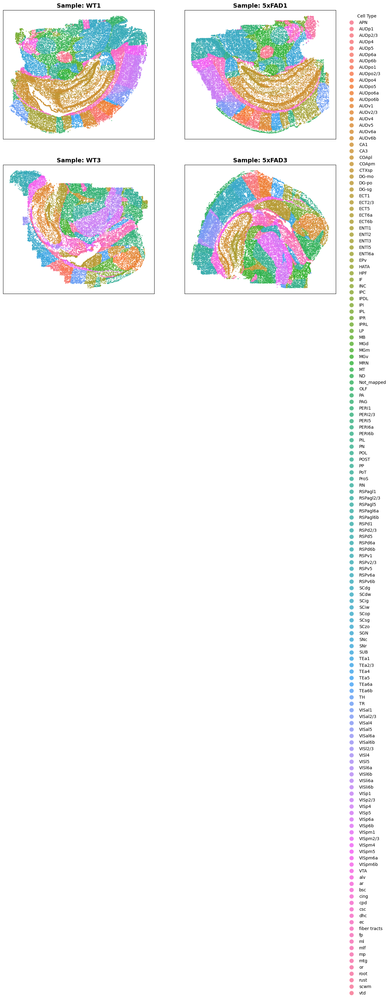

In [32]:
import matplotlib.pyplot as plt
import scanpy as sc
import seaborn as sns

samples = adata.obs["sample_id"].unique()[:4]

fig, axes = plt.subplots(2, 2, figsize=(14, 12), sharex=False, sharey=False)
axes = axes.flatten()

for i, sample_id in enumerate(samples):
    ax = axes[i]
    sub_adata = adata[adata.obs["sample_id"] == sample_id]

    x = sub_adata.obsm["spatial"][:, 0]
    y = sub_adata.obsm["spatial"][:, 1]
    cell_types = sub_adata.obs["CCF_acronym"]

    sns.scatterplot(
        x=x,
        y=y,
        hue=cell_types,
        ax=ax,
        s=4,
        linewidth=0,
        alpha=0.8,
        legend=(i == 1),
    )

    ax.set_title(f"Sample: {sample_id}", fontsize=14, fontweight="bold")
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.set_xticks([])
    ax.set_yticks([])
    ax.invert_yaxis()

if axes[1].get_legend():
    axes[1].legend(
        bbox_to_anchor=(1.05, 1),
        loc="upper left",
        markerscale=5,
        frameon=False,
        title="Cell Type",
    )

plt.tight_layout()
plt.show()

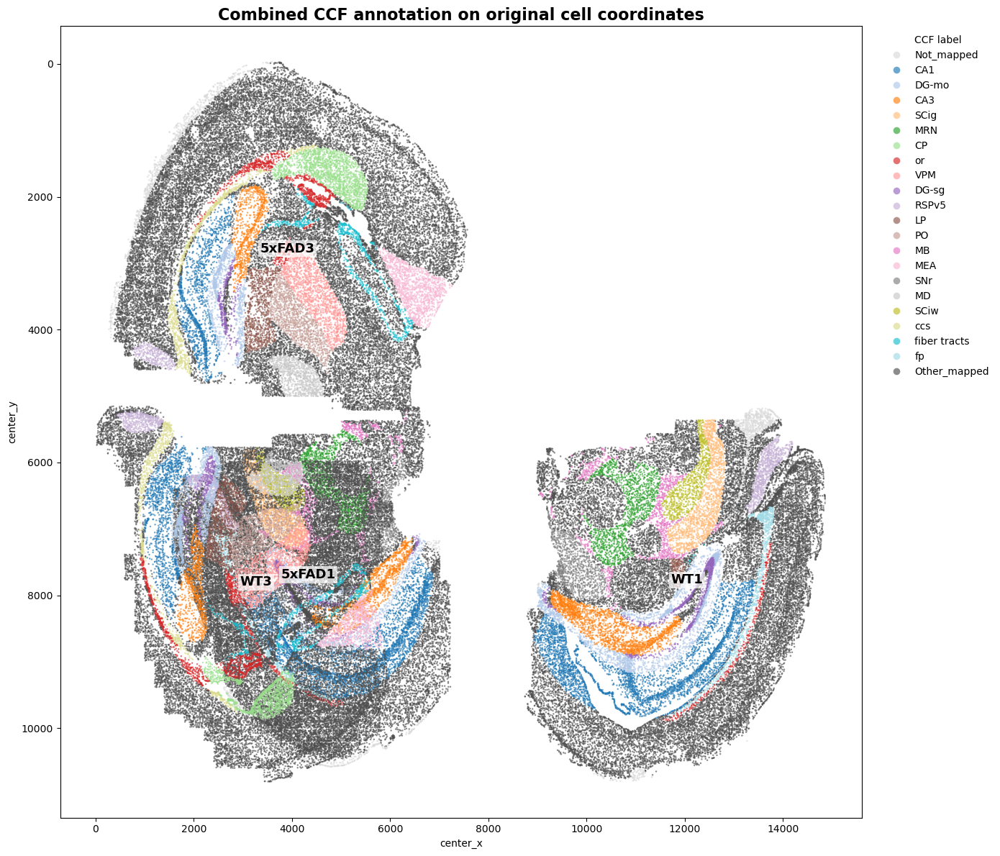

Displayed combined original-coordinate CCF annotation for: ['WT1', '5xFAD1', 'WT3', '5xFAD3']
Top plotted labels: ['CA1', 'DG-mo', 'CA3', 'SCig', 'MRN', 'CP', 'or', 'VPM', 'DG-sg', 'RSPv5', 'LP', 'PO', 'MB', 'MEA', 'SNr', 'MD', 'SCiw', 'ccs', 'fiber tracts', 'fp']


In [33]:
# 12) Combined original-coordinate CCF annotation plot for all 4 samples
sample_order = [s for s in ["WT1", "5xFAD1", "WT3", "5xFAD3"] if s in adata.obs["sample_id"].astype(str).unique()]
plot_df = adata.obs.copy()
plot_df["sample_id"] = plot_df["sample_id"].astype(str)
plot_df = plot_df[plot_df["sample_id"].isin(sample_order)].copy()
plot_df["CCF_plot_label"] = plot_df["CCF_acronym"].astype(str)

top_labels = plot_df.loc[plot_df["CCF_plot_label"] != "Not_mapped", "CCF_plot_label"].value_counts().head(20).index.tolist()
plot_df.loc[(plot_df["CCF_plot_label"] != "Not_mapped") & (~plot_df["CCF_plot_label"].isin(top_labels)), "CCF_plot_label"] = "Other_mapped"

palette = {"Not_mapped": "#d9d9d9", "Other_mapped": "#4d4d4d"}
base_colors = sns.color_palette("tab20", n_colors=max(len(top_labels), 1))
for label, color in zip(top_labels, base_colors):
    palette[label] = color

fig, ax = plt.subplots(figsize=(14, 12))
hue_order = ["Not_mapped"] + top_labels + (["Other_mapped"] if "Other_mapped" in plot_df["CCF_plot_label"].values else [])
sns.scatterplot(
    data=plot_df,
    x="center_x",
    y="center_y",
    hue="CCF_plot_label",
    hue_order=[h for h in hue_order if h in plot_df["CCF_plot_label"].unique()],
    palette=palette,
    s=3,
    linewidth=0,
    alpha=0.65,
    ax=ax,
    legend=True,
 )

for sample_id in sample_order:
    sub = plot_df[plot_df["sample_id"] == sample_id]
    if len(sub) == 0:
        continue
    xmid = float(np.nanmedian(sub["center_x"]))
    ymid = float(np.nanmedian(sub["center_y"]))
    ax.text(xmid, ymid, sample_id, fontsize=13, fontweight="bold", ha="center", va="center", color="black", bbox=dict(facecolor="white", alpha=0.7, edgecolor="none", pad=2))

ax.invert_yaxis()
ax.set_title("Combined CCF annotation on original cell coordinates", fontsize=16, fontweight="bold")
ax.set_xlabel("center_x")
ax.set_ylabel("center_y")
ax.legend(bbox_to_anchor=(1.02, 1), loc="upper left", markerscale=4, frameon=False, title="CCF label")
plt.tight_layout()
plt.show()

print("Displayed combined original-coordinate CCF annotation for:", sample_order)
print("Top plotted labels:", top_labels)

In [47]:
# Rebuild CCF major regions into 10 broad groups (hierarchy-aware, no Other)
import numpy as np
import pandas as pd

if "ccf_id" not in adata.obs.columns or "CCF_acronym" not in adata.obs.columns:
    raise RuntimeError("Run CCF mapping first to create ccf_id and CCF_acronym.")
if "st" not in globals():
    raise RuntimeError("structure tree (st) not found. Run atlas-loading cells first.")

id_col_local = "id" if "id" in st.columns else st.columns[0]
acr_col_local = "acronym" if "acronym" in st.columns else None
name_col_local = "name" if "name" in st.columns else None
path_col_local = "structure_id_path" if "structure_id_path" in st.columns else None

st2 = st.copy()
st2[id_col_local] = st2[id_col_local].astype(int)

id_to_acr_local = {}
id_to_name_local = {}
for _, r in st2.iterrows():
    rid = int(r[id_col_local])
    id_to_acr_local[rid] = str(r[acr_col_local]) if acr_col_local is not None else str(rid)
    id_to_name_local[rid] = str(r[name_col_local]) if name_col_local is not None else str(rid)

id_to_path_ids = {}
if path_col_local is not None:
    for _, r in st2[[id_col_local, path_col_local]].dropna().iterrows():
        rid = int(r[id_col_local])
        raw = str(r[path_col_local]).strip().strip("/")
        if raw == "":
            id_to_path_ids[rid] = []
        else:
            id_to_path_ids[rid] = [int(x) for x in raw.split("/") if x != ""]

fiber_acr = {"fiber tracts", "ccs", "ec", "scwm", "fi", "alv", "cing", "dhc", "or", "ar", "fp"}

def _region10_from_row(ccf_id, ccf_acr):
    try:
        cid = int(ccf_id)
    except Exception:
        cid = -1
    acr = str(ccf_acr)

    if cid <= 0 or acr == "Not_mapped":
        return "Not_mapped"

    anc_ids = id_to_path_ids.get(cid, [])
    anc_acr = [id_to_acr_local.get(i, "") for i in anc_ids]
    anc_name = " ".join([id_to_name_local.get(i, "") for i in anc_ids]).lower()
    anc_acr_set = set(anc_acr)
    acr_low = acr.lower()

    if (acr in fiber_acr) or (acr_low in fiber_acr) or ("fiber tracts" in anc_name):
        return "Fiber"

    if ("hpf" in anc_acr_set) or ("hippocamp" in anc_name) or acr.startswith("CA") or acr.startswith("DG") or acr in {"SUB", "ProS"}:
        return "Hippocampus"

    if ("olf" in anc_acr_set) or ("olfactory" in anc_name) or ("amygdal" in anc_name) or acr.startswith(("BLA", "BMA", "BLAa", "BLAp", "BLAv", "CEA", "MEA", "LA", "COA", "PA")):
        return "Olfactory_Amygdala"

    if ("striat" in anc_name) or ("pal" in anc_acr_set) or ("pallid" in anc_name) or acr in {"CP", "ACB", "STR", "GPe", "GPi", "SI", "PAL", "EPd", "EPv", "SNr"}:
        return "Striatum_Pallidum"

    if ("thalamus" in anc_name) or ("TH" in anc_acr_set) or acr in {"LP", "PO", "MD", "VPM", "VPL", "VM", "CL", "RT", "LGd-sh", "LGd-co", "LGd-ip", "LGv"}:
        return "Thalamus"

    if ("hypothalamus" in anc_name) or ("HY" in anc_acr_set) or acr in {"LHA", "ARH", "DMH", "VMH", "PH"}:
        return "Hypothalamus"

    if ("midbrain" in anc_name) or ("MB" in anc_acr_set) or acr in {"SCig", "SCiw", "SCsg", "RN", "VTA", "PAG", "MRN", "ZI", "STN"}:
        return "Midbrain"

    if ("hindbrain" in anc_name) or ("pons" in anc_name) or ("medulla" in anc_name) or ("cerebell" in anc_name) or ("HB" in anc_acr_set):
        return "Hindbrain"

    if ("isocortex" in anc_name) or ("cortex" in anc_name) or acr.startswith(("VIS", "AUD", "RSP", "SSp", "SSs", "TEa", "ECT", "ENT")):
        return "Cortex"

    # No 'Other': force remaining mapped acronyms into a named broad region.
    return "Hindbrain"

adata.obs["CCF_major"] = [
    _region10_from_row(cid, acr)
    for cid, acr in zip(adata.obs["ccf_id"].values, adata.obs["CCF_acronym"].values)
]

print("CCF_major rebuilt with named broad groups (no Other)")
print(adata.obs["CCF_major"].value_counts())

CCF_major rebuilt with named broad groups (no Other)
CCF_major
Cortex                36234
Hippocampus           27136
Thalamus              22724
Fiber                 16362
Midbrain              14812
Olfactory_Amygdala     9887
Striatum_Pallidum      5983
Not_mapped             1871
Hindbrain              1447
Name: count, dtype: int64


/tmp/ipykernel_1513194/641357223.py:45: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout()


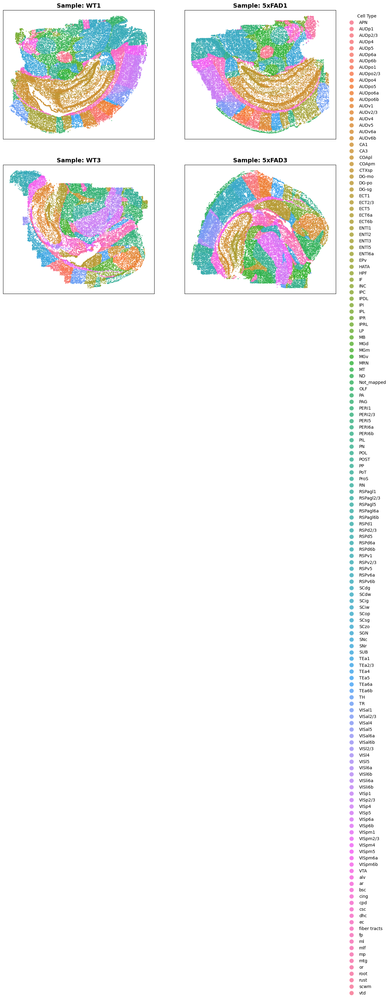

In [35]:
import matplotlib.pyplot as plt
import scanpy as sc
import seaborn as sns

samples = adata.obs["sample_id"].unique()[:4]

fig, axes = plt.subplots(2, 2, figsize=(14, 12), sharex=False, sharey=False)
axes = axes.flatten()

for i, sample_id in enumerate(samples):
    ax = axes[i]
    sub_adata = adata[adata.obs["sample_id"] == sample_id]

    x = sub_adata.obsm["spatial"][:, 0]
    y = sub_adata.obsm["spatial"][:, 1]
    cell_types = sub_adata.obs["CCF_acronym"]

    sns.scatterplot(
        x=x,
        y=y,
        hue=cell_types,
        ax=ax,
        s=4,
        linewidth=0,
        alpha=0.8,
        legend=(i == 1),
    )

    ax.set_title(f"Sample: {sample_id}", fontsize=14, fontweight="bold")
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.set_xticks([])
    ax.set_yticks([])
    ax.invert_yaxis()

if axes[1].get_legend():
    axes[1].legend(
        bbox_to_anchor=(1.05, 1),
        loc="upper left",
        markerscale=5,
        frameon=False,
        title="Cell Type",
    )

plt.tight_layout()
plt.show()

In [52]:
adata.write_h5ad("/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/after_bulk_ccf_annotated.h5ad")

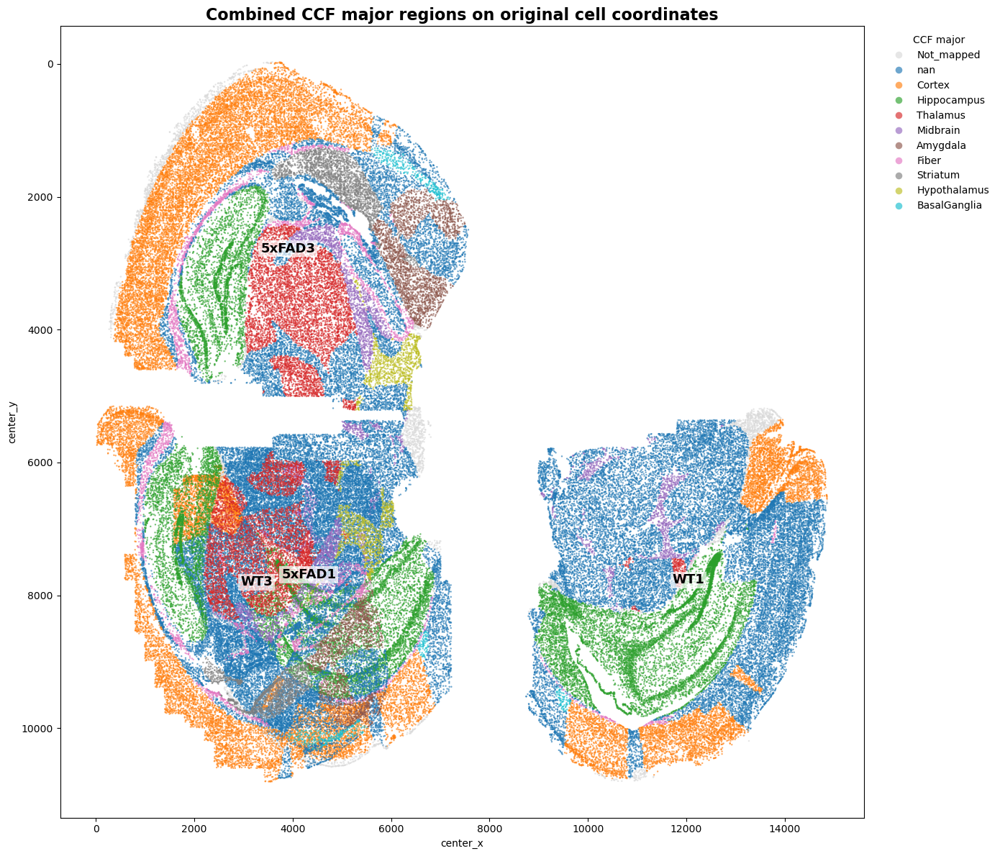

Displayed combined original-coordinate CCF major annotation for: ['WT1', '5xFAD1', 'WT3', '5xFAD3']
Plotted labels: ['nan', 'Cortex', 'Hippocampus', 'Thalamus', 'Midbrain', 'Amygdala', 'Fiber', 'Striatum', 'Hypothalamus', 'BasalGanglia']


In [37]:
sample_order = [s for s in ["WT1", "5xFAD1", "WT3", "5xFAD3"] if s in adata.obs["sample_id"].astype(str).unique()]

plot_df = adata.obs.copy()
plot_df["sample_id"] = plot_df["sample_id"].astype(str)
plot_df = plot_df[plot_df["sample_id"].isin(sample_order)].copy()

plot_df["CCF_plot_label"] = plot_df["CCF_major"].astype(str)

top_labels = (
    plot_df.loc[plot_df["CCF_plot_label"] != "Not_mapped", "CCF_plot_label"]
    .value_counts()
    .index
    .tolist()
)

palette = {"Not_mapped": "#d9d9d9"}
base_colors = sns.color_palette("tab10", n_colors=max(len(top_labels), 1))
for label, color in zip(top_labels, base_colors):
    palette[label] = color

fig, ax = plt.subplots(figsize=(14, 12))

hue_order = ["Not_mapped"] + top_labels

sns.scatterplot(
    data=plot_df,
    x="center_x",
    y="center_y",
    hue="CCF_plot_label",
    hue_order=[h for h in hue_order if h in plot_df["CCF_plot_label"].unique()],
    palette=palette,
    s=3,
    linewidth=0,
    alpha=0.65,
    ax=ax,
    legend=True,
)

for sample_id in sample_order:
    sub = plot_df[plot_df["sample_id"] == sample_id]
    if len(sub) == 0:
        continue
    xmid = float(np.nanmedian(sub["center_x"]))
    ymid = float(np.nanmedian(sub["center_y"]))
    ax.text(
        xmid,
        ymid,
        sample_id,
        fontsize=13,
        fontweight="bold",
        ha="center",
        va="center",
        color="black",
        bbox=dict(facecolor="white", alpha=0.7, edgecolor="none", pad=2),
    )

ax.invert_yaxis()
ax.set_title("Combined CCF major regions on original cell coordinates", fontsize=16, fontweight="bold")
ax.set_xlabel("center_x")
ax.set_ylabel("center_y")
ax.legend(
    bbox_to_anchor=(1.02, 1),
    loc="upper left",
    markerscale=4,
    frameon=False,
    title="CCF major",
)

plt.tight_layout()
plt.show()

print("Displayed combined original-coordinate CCF major annotation for:", sample_order)
print("Plotted labels:", top_labels)

In [50]:
# Diagnostic) Why CCF_major has many Not_mapped
import pandas as pd

if "CCF_acronym" not in adata.obs.columns or "CCF_major" not in adata.obs.columns:
    raise RuntimeError("Run CCF mapping and CCF_major assignment cells first.")

diag = adata.obs[["CCF_acronym", "CCF_major"]].copy()
diag["CCF_acronym"] = diag["CCF_acronym"].astype(str)
diag["CCF_major"] = diag["CCF_major"].astype(str)

is_ccf_mapped = diag["CCF_acronym"] != "Not_mapped"
is_major_missing = diag["CCF_major"].isin(["nan", "None", "", "Not_mapped"] )

print("Total cells:", len(diag))
print("CCF_acronym mapped:", int(is_ccf_mapped.sum()))
print("CCF_major missing/Not_mapped:", int(is_major_missing.sum()))
print("Mapped in acronym but missing in CCF_major:", int((is_ccf_mapped & is_major_missing).sum()))

missing_acr = diag.loc[is_ccf_mapped & is_major_missing, "CCF_acronym"].value_counts().head(30)
print("\nTop missing acronyms not covered by ccf_mapping:")
print(missing_acr)

Total cells: 136456
CCF_acronym mapped: 134585
CCF_major missing/Not_mapped: 1871
Mapped in acronym but missing in CCF_major: 0

Top missing acronyms not covered by ccf_mapping:
Series([], Name: count, dtype: int64)


In [41]:
# Fix) Rebuild CCF_major so dictionary gaps are not counted as Not_mapped
if "CCF_acronym" not in adata.obs.columns:
    raise RuntimeError("CCF_acronym not found. Run CCF mapping cell first.")
if "ccf_mapping" not in globals():
    raise RuntimeError("ccf_mapping dictionary not found. Run the CCF_major mapping cell first.")

ccf_acr = adata.obs["CCF_acronym"].astype(str)
ccf_major = ccf_acr.map(ccf_mapping)

# Only true unmapped cells stay Not_mapped.
is_true_unmapped = ccf_acr.eq("Not_mapped")
ccf_major = ccf_major.where(~is_true_unmapped, "Not_mapped")

# Dictionary misses among mapped acronyms go to Other_mapped (not Not_mapped).
is_dict_miss = ccf_major.isna() & (~is_true_unmapped)
ccf_major = ccf_major.where(~is_dict_miss, "Other_mapped")

adata.obs["CCF_major"] = ccf_major.astype(str)

print("CCF_major rebuilt")
print(" - True Not_mapped (from CCF_acronym):", int(is_true_unmapped.sum()))
print(" - Dictionary-miss -> Other_mapped:", int(is_dict_miss.sum()))
print("\nCCF_major counts:")
print(adata.obs["CCF_major"].value_counts())

CCF_major rebuilt
 - True Not_mapped (from CCF_acronym): 1871
 - Dictionary-miss -> Other_mapped: 54623

CCF_major counts:
CCF_major
Other_mapped    54623
Cortex          27909
Hippocampus     22504
Thalamus        10628
Midbrain         4353
Amygdala         3922
Fiber            3541
Striatum         3354
Not_mapped       2998
Hypothalamus     1876
BasalGanglia      748
Name: count, dtype: int64


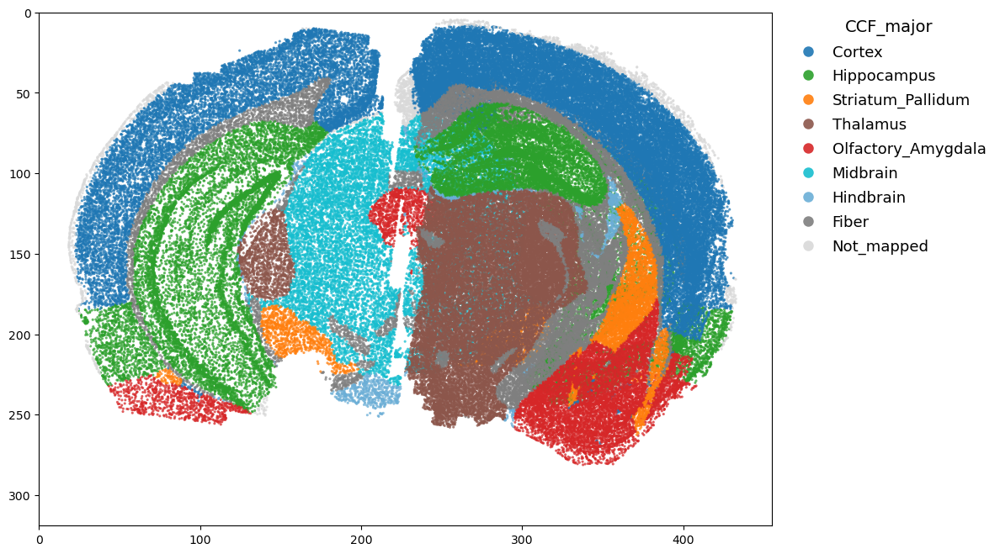

CCF_major counts:
CCF_major
Cortex                36234
Hippocampus           27136
Thalamus              22724
Fiber                 16362
Midbrain              14812
Olfactory_Amygdala     9887
Striatum_Pallidum      5983
Not_mapped             1871
Hindbrain              1447
Name: count, dtype: int64


In [55]:
# Final) Voxel-space plot without sample split, colored by CCF_major
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.lines import Line2D

required_cols = ["x_ccf_vox", "y_ccf_vox", "CCF_major"]
missing = [c for c in required_cols if c not in adata.obs.columns]
if len(missing) > 0:
    raise RuntimeError(f"Missing columns in adata.obs: {missing}. Run mapping/CCF_major cells first.")

plot_df = adata.obs[["x_ccf_vox", "y_ccf_vox", "CCF_major"]].copy()
plot_df["CCF_major"] = plot_df["CCF_major"].astype(str).replace("nan", "Not_mapped")
plot_df = plot_df.replace([np.inf, -np.inf], np.nan).dropna(subset=["x_ccf_vox", "y_ccf_vox"] )

# Separate controls: figure dots vs legend dots
FIG_DOT_SIZE = 5
LEGEND_DOT_SIZE = 9.0

# Keep major classes + fallback color for undefined
major_order = [
    "Cortex", "Hippocampus", "Striatum_Pallidum", "Thalamus", "Hypothalamus",
    "Olfactory_Amygdala", "Midbrain", "Hindbrain", "Fiber", "Not_mapped"
]
present = plot_df["CCF_major"].value_counts().index.tolist()
extra = [x for x in present if x not in major_order]
hue_order = [x for x in major_order if x in present] + extra

palette = {
    "Cortex": "#1f77b4",
    "Hippocampus": "#2ca02c",
    "Striatum_Pallidum": "#ff7f0e",
    "Thalamus": "#8c564b",
    "Hypothalamus": "#e377c2",
    "Olfactory_Amygdala": "#d62728",
    "Midbrain": "#17becf",
    "Hindbrain": "#6baed6",
    "Fiber": "#7f7f7f",
    "Not_mapped": "#d9d9d9",
}
if len(extra) > 0:
    extra_colors = sns.color_palette("husl", n_colors=len(extra))
    for k, c in zip(extra, extra_colors):
        palette[k] = c

fig, ax = plt.subplots(figsize=(12, 9))
sns.scatterplot(
    data=plot_df,
    x="x_ccf_vox",
    y="y_ccf_vox",
    hue="CCF_major",
    hue_order=hue_order,
    palette=palette,
    s=FIG_DOT_SIZE,
    linewidth=0,
    alpha=0.75,
    ax=ax,
    legend=False,
 )

# Atlas voxel orientation
ax.set_xlim(0, annotation_vol.shape[2] - 1)
ax.set_ylim(annotation_vol.shape[1] - 1, 0)
ax.set_aspect("equal")
ax.set_xlabel("")
ax.set_ylabel("")

legend_handles = [
    Line2D([0], [0], marker="o", linestyle="",
           markerfacecolor=palette[label], markeredgecolor="none",
           markersize=LEGEND_DOT_SIZE, alpha=0.9)
    for label in hue_order
]
ax.legend(
    legend_handles,
    hue_order,
    bbox_to_anchor=(1.02, 1),
    loc="upper left",
    frameon=False,
    title="CCF_major",
    fontsize=13,
    title_fontsize=14,
    labelspacing=0.6,
    borderaxespad=0.0,
    handletextpad=0.6,
 )

plt.tight_layout()
plt.show()

print("CCF_major counts:")
print(plot_df["CCF_major"].value_counts())